In [2]:
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv')

In [4]:
df

,Facility ID,Facility Name,Facility Group,Facility Type,Address,Latitude,Longitude,Geometry
0,C-C-001,Rose Hill Cemetery,Cemeteries,Cemetery,"1100 W 4Th Street, Bloomington, IN",39.165708,-86.545797,POINT (-86.545797 39.165708)
1,C-C-002,White Oak Cemetery,Cemeteries,Cemetery,"1200 W 7Th Street, Bloomington, IN",39.169052,-86.548152,POINT (-86.548152 39.169052)
2,DC-A-001,Big Woods Bloomington,Dining & Cafes,American,"116 N Grant Street, Bloomington, IN",39.167131,-86.529590,POINT (-86.52958997532201 39.16713145)
3,DC-A-002,Half Bottle Bistro,Dining & Cafes,American,"3115 S Sare Road, Bloomington, IN",39.133184,-86.497784,POINT (-86.49778373505043 39.13318445)
4,DC-A-003,Hive,Dining & Cafes,American,"2608 E 10Th Street, Bloomington, IN",39.170754,-86.501125,POINT (-86.5011251 39.1707541)
...,...,...,...,...,...,...,...,...
388,TP-T-031,Rev Ernest D Butler Park Southern Trail Head,Trails & Playgrounds,Trailhead,"At W 9Th Street Across From N William Street, ...",39.170523,-86.543203,POINT (-86.543203 39.170523)
389,TP-T-032,Griffy Creek Trail Griffy Lake Trail Head,Trails & Playgrounds,Trailhead,East End Of The Griffy Lake Boathouse Parking ...,39.197789,-86.511654,POINT (-86.511654 39.197789)
390,TP-T-033,Griffy Creek Trail East Trail Head,Trails & Playgrounds,Trailhead,East End Of Griffy Creek Trail On The East Sid...,39.204914,-86.486520,POINT (-86.48652 39.204914)
391,TP-T-034,Polly Grimshaw Trail East Trail Head,Trails & Playgrounds,Trailhead,"At E Longview Avenue And Glenwood Avenue W, Bl...",39.167989,-86.490172,POINT (-86.490172 39.167989)


In [5]:
import geopandas as gpd
from shapely.geometry import Point   # ← add this

# assuming df is already filtered to the 293 valid rows:
gdf = gpd.GeoDataFrame(
    df,
    geometry=df.apply(lambda r: Point(r["Longitude"], r["Latitude"]), axis=1),
    crs="EPSG:4326"
)
gdf.to_file("bloomington_facilities_clean.geojson", driver="GeoJSON")

In [7]:
counts = df.groupby("Facility Group").size().reset_index(name="count")
print(counts)

                Facility Group  count
0                   Cemeteries      2
1               Dining & Cafes     59
2         Education & Learning     64
3  Emergency & Safety Services     28
4  Government & Civic Services     47
5        Healthcare & Wellness     22
6            Parking & Garages     21
7         Parks & Green Spaces     56
8  Retail & Community Services     36
9         Trails & Playgrounds     58


## Trying out different plots to select the best ones

In [9]:
import folium
from folium.plugins import MarkerCluster, HeatMap
from IPython.display import display

# 1. Marker‐Cluster Map
m_cluster = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron"
)
cluster = MarkerCluster().add_to(m_cluster)

# Updated color map per new Facility Group
colors = {
    "Cemeteries": "black",
    "Dining & Cafes": "chocolate",
    "Education & Learning": "purple",
    "Emergency & Safety Services": "navy",
    "Government & Civic Services": "orange",
    "Healthcare & Wellness": "red",
    "Parking & Garages": "gray",
    "Parks & Green Spaces": "green",
    "Retail & Community Services": "teal",
    "Trails & Playgrounds": "olive"
}


for _, row in gdf.iterrows():
    folium.CircleMarker(
        location=(row.geometry.y, row.geometry.x),
        radius=4,
        color=colors.get(row["Facility Group"], "gray"),
        fill=True,
        fill_opacity=0.7,
        popup=(
            f"<strong>{row['Facility Name']}</strong><br>"
            f"{row['Facility Type']}<br>"
            f"{row['Address']}"
        )
    ).add_to(cluster)

# Display inline and save to file
display(m_cluster)

In [10]:
# 2. Heatmap Prototype
m_heat = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron"
)
# extract [lat, lon] list:
heat_data = [[pt.y, pt.x] for pt in gdf.geometry]
HeatMap(
    heat_data,
    radius=15,
    blur=25,
).add_to(m_heat)

# Display inline and save to file
display(m_heat)

In [12]:
import folium
from folium.plugins import MarkerCluster, HeatMap, Fullscreen, MiniMap, MeasureControl

# assume gdf exists (EPSG:4326)
m = folium.Map(
    [39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron",
    control_scale=True      # ← turns on the scale bar
)

# 1) marker‐cluster
cluster = MarkerCluster(name="Facilities").add_to(m)
for _, r in gdf.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude],
        radius=5,
        color="steelblue",
        fill=True,
        fill_opacity=0.7,
        popup=f"{r['Facility Name']}<br>{r['Facility Type']}"
    ).add_to(cluster)

# 2) heatmap layer (toggleable)
HeatMap(
    list(zip(gdf.Latitude, gdf.Longitude)),
    name="Density Heatmap",
    radius=15, blur=20,
    gradient={0.2:'blue',0.4:'cyan',0.6:'lime',0.8:'yellow',1.0:'red'}
).add_to(m)

# 3) controls & legend stub
folium.LayerControl(collapsed=False).add_to(m)
Fullscreen().add_to(m)
MiniMap().add_to(m)
MeasureControl().add_to(m)

# render
m  # inline in Jupyter

In [13]:
import requests
import geopandas as gpd
from shapely.geometry import shape

# 1a. REST endpoint for “City Neighborhood Associations” (layer 2)
url = (
  "https://bloomington.in.gov/arcgis-server/rest/services/"
  "DataPortal/DataPortal_Neighborhoods/MapServer/2/query"
)

params = {
    "where": "1=1",
    "outFields": "*",
    "outSR": "4326",     # return lat/long
    "f": "geojson"       # GeoJSON format
}

# Fetch & parse
resp = requests.get(url, params=params)
resp.raise_for_status()
data = resp.json()

# Convert to GeoDataFrame
neighborhoods = gpd.GeoDataFrame.from_features(
    data["features"],
    crs="EPSG:4326"
)

In [14]:
neighborhoods

,geometry,objectid,neighborhood,quadrant,part_flag,part_name,jurisdiction,association1_name,association2_name,association_status,nbrlabel,nbrid,st_area(shape),st_length(shape),globalid
0,"POLYGON ((-86.52691 39.14742, -86.52686 39.147...",54,Pinestone,SE,None,None,Bloomington,Pinestone Neighborhood Association,None,Current,Pinestone,46,7.229737e+05,3716.355568,{EE56CB3E-74EE-47EF-A09B-05B8E0366F43}
1,"POLYGON ((-86.52849 39.18788, -86.5285 39.1881...",29,Matlock Heights,NE,None,None,Bloomington,Matlock Heights Neighborhood Organization,None,Current,Matlock Heights,2,2.628540e+06,6782.461949,{9FB09153-F67C-4A56-AA36-A89A1322B4FB}
2,"POLYGON ((-86.53651 39.14995, -86.53631 39.149...",71,McDoel Gardens,SW,None,None,Bloomington,McDoel Gardens Neighborhood Association,None,Current,McDoel Gardens,26,5.251131e+06,12449.023213,{ACC9D175-516D-4962-A871-022E8F1BDEA6}
3,"POLYGON ((-86.49071 39.16803, -86.4907 39.1678...",68,Park Ridge,NE,None,None,Bloomington,Park Ridge Neighborhood Association,None,None,Park Ridge,37,3.626680e+06,9537.428380,{0EAA6173-27E3-4294-B1D4-FEBA3B601065}
4,"POLYGON ((-86.49897 39.14205, -86.49911 39.142...",4,Spicewood,SE,None,None,Bloomington,Spicewood Neighborhood Association,None,Current,Spicewood,62,3.553685e+06,8399.969176,{291998A7-E22F-4352-9AB8-62CF62A0C981}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,"POLYGON ((-86.49439 39.1504, -86.4944 39.15028...",23,Shadow Creek,SE,,None,Bloomington,Shadow Creek Neighborhood Association,None,Current,Shadow Creek,71,7.413946e+05,3392.091111,{EBB8ADA5-EB5E-402E-BF51-5A9A2B245EB9}
67,"POLYGON ((-86.47226 39.15316, -86.47182 39.153...",56,Gentry Estates,SE,None,None,Bloomington,"Gentry Estates Association, Inc.",None,Current,Gentry Estates,29,3.107601e+06,7434.849724,{BF9B08BD-8F8A-4C68-9D0E-56F4D60ADADC}
68,"POLYGON ((-86.47611 39.15879, -86.47611 39.158...",58,Gentry Honours,SE,None,None,Bloomington,Gentry Honours,None,Proposed,Gentry Honours,None,2.097970e+06,5837.537814,{B1C68B71-2AE0-462C-8653-BDE765A9CB1A}
69,"POLYGON ((-86.51415 39.14618, -86.51364 39.146...",8,Arden Place,SE,None,None,Bloomington,Arden Place Neighborhood Association,None,Current,Arden Place,14,1.171759e+06,4718.981941,{E21723B8-9529-4AED-B3FE-34A1EB5D4642}


In [15]:
import geopandas as gpd
import folium
from branca.colormap import linear

import requests
import geopandas as gpd
import folium
from branca.element import Template, MacroElement
from branca.colormap import linear
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# — ASSUMPTION: you already have your facility GeoDataFrame as `gdf` (EPSG:4326). —

# 1) Fetch Bloomington neighborhoods via ArcGIS REST as GeoJSON
url = (
    "https://bloomington.in.gov/arcgis-server/rest/services/"
    "DataPortal/DataPortal_Neighborhoods/MapServer/2/query"
)
params = {"where":"1=1","outFields":"*","outSR":"4326","f":"geojson"}
resp = requests.get(url, params=params)
resp.raise_for_status()
neighborhoods = gpd.GeoDataFrame.from_features(
    resp.json()["features"], crs="EPSG:4326"
)

# 2) Spatial‐join points → polygons, count & normalize
joined = gpd.sjoin(neighborhoods, gdf, how="left", predicate="contains")
counts = joined.groupby(joined.index.rename("nbr_idx")).size().rename("facility_count")
neighborhoods["facility_count"] = counts.reindex(neighborhoods.index).fillna(0).astype(int)
minc, maxc = neighborhoods["facility_count"].min(), neighborhoods["facility_count"].max()
neighborhoods["score"] = (neighborhoods["facility_count"] - minc) / (maxc - minc)

# 3) Build the map with polished styling
cmap = linear.YlGnBu_09.scale(0, 1)  
cmap.caption = "Facility Availability (low → high)"

m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron",
    control_scale=True
)

# 3a) Add a custom title
title_html = """
<div style="
  position: fixed; top: 10px; left:50%; transform: translateX(-50%);
  z-index:9999; font-size:22px; font-weight:bold;
  background:white; padding:6px 12px; border-radius:4px;
  box-shadow:0 2px 6px rgba(0,0,0,0.3);
">
  Bloomington Facility Availability
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

# 3b) Choropleth of neighborhoods
folium.GeoJson(
    neighborhoods,
    name="Availability",
    style_function=lambda feat: {
        "fillColor": cmap(feat["properties"]["score"]),
        "color": "#444444",
        "weight": 1.5,
        "fillOpacity": 0.6,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["part_name","facility_count"],
        aliases=["Neighborhood:","Count:"],
        localize=True
    )
).add_to(m)

# 3c) Legend (colormap) & controls
cmap.add_to(m)
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)

# 3d) Marker cluster overlay for exact locations
cluster = MarkerCluster(name="Facilities").add_to(m)
for _, r in gdf.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude],
        radius=4,
        color="black",
        fill=True,
        fill_opacity=0.6
    ).add_to(cluster)

# 3e) Layer toggle (neighborhood vs. points)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

# 4) Display
m  # renders inline in Jupyter

In [16]:
import math
import geopandas as gpd
from shapely.geometry import Polygon
import pandas as pd

# 1a) Project your facilities to WebMercator for meter-based grid
gdf_p = gdf.to_crs(epsg=3857)

# 1b) Compute city bounds + hex parameters
xmin, ymin, xmax, ymax = gdf_p.total_bounds
hex_radius = 500                     # meters (500m from center to vertex)
dx = 3*hex_radius                    # horizontal step between columns
dy = math.sqrt(3)*hex_radius         # vertical spacing between centers

# 1c) Build the hexagons
polys = []
x = xmin
col = 0
while x < xmax + dx:
    # stagger every other column
    y_start = ymin + (dy/2 if col % 2 else 0)
    y = y_start
    while y < ymax + dy:
        # build one hexagon around center (x,y)
        coords = []
        for angle in range(0, 360, 60):
            theta = math.radians(angle)
            coords.append((x + hex_radius*math.cos(theta),
                           y + hex_radius*math.sin(theta)))
        polys.append(Polygon(coords))
        y += dy
    x += dx * 0.75
    col += 1

# 1d) Hex-grid GeoDataFrame in WebMercator
hexgrid = gpd.GeoDataFrame(
    {'geometry': polys},
    crs="EPSG:3857"
)

# 1e) Reproject to WGS84 for mapping
hexgrid = hexgrid.to_crs(epsg=4326)

In [17]:
# spatial join: which point in which hexagon
join = gpd.sjoin(hexgrid, gdf, how="left", predicate="contains")

# count per hex
counts = join.groupby(join.index.rename("hex_idx")).size().rename("facility_count")
hexgrid["facility_count"] = counts.reindex(hexgrid.index).fillna(0).astype(int)

# normalize 0–1 for color ramp
minc, maxc = hexgrid["facility_count"].min(), hexgrid["facility_count"].max()
hexgrid["score"] = (hexgrid["facility_count"] - minc) / (maxc - minc)

In [18]:
import folium
from branca.colormap import linear
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl
from IPython.display import display

# colorblind-safe YlGnBu ramp
cmap = linear.YlGnBu_09.scale(0, 1)
cmap.caption = "Facility Density (low → high)"

m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron",
    control_scale=True
)

# 3a) Add hex-polygons
folium.GeoJson(
    hexgrid,
    name="Hex-Bins",
    style_function=lambda feat: {
        "fillColor": cmap(feat["properties"]["score"]),
        "color": "#888888",
        "weight": 0.5,
        "fillOpacity": 0.6,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["facility_count"],
        aliases=["Facilities:"]
    )
).add_to(m)

# 3b) Colormap legend & extra controls
cmap.add_to(m)
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)

# 3c) Overlay raw points as a toggleable cluster
cluster = MarkerCluster(name="Facilities").add_to(m)
for _, r in gdf.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude],
        radius=3,
        color="black",
        fill=True,
        fill_opacity=0.5
    ).add_to(cluster)

folium.LayerControl(collapsed=False).add_to(m)

# 4) Display
display(m)

/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/3504070192.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  viridis = cm.get_cmap("viridis", 256)



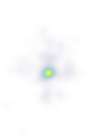

In [19]:
import numpy as np
import geopandas as gpd
import folium
from folium import raster_layers
from sklearn.neighbors import KernelDensity
from matplotlib import cm, colors
from PIL import Image

# -------------------------------------------------
# 0) ASSUME `gdf` is your facilities GeoDataFrame (EPSG:4326)
# -------------------------------------------------

# 1) Project to WebMercator (meters) for KDE
gdf_m = gdf.to_crs(epsg=3857)
X = np.vstack([gdf_m.geometry.x, gdf_m.geometry.y]).T

# 2) Build a grid covering the city
xmin, ymin, xmax, ymax = gdf_m.total_bounds
padding = 1000   # meters
xmin, ymin, xmax, ymax = xmin-padding, ymin-padding, xmax+padding, ymax+padding
grid_spacing = 200  # meters between grid cells

xgrid = np.arange(xmin, xmax, grid_spacing)
ygrid = np.arange(ymin, ymax, grid_spacing)
xx, yy = np.meshgrid(xgrid, ygrid)
grid_coords = np.vstack([xx.ravel(), yy.ravel()]).T

# 3) Fit KDE & evaluate on grid
bandwidth = 700     # meters; tweak for smoother or sharper surface
kde = KernelDensity(bandwidth=bandwidth, metric="euclidean",
                    kernel="gaussian", algorithm="ball_tree")
kde.fit(X)
log_dens = kde.score_samples(grid_coords)
dens = np.exp(log_dens).reshape(xx.shape)

# 4) Normalize 0–1 for colour-mapping
dens_norm = (dens - dens.min()) / (dens.max() - dens.min())

# 5) Convert to a PNG with a colour-blind-safe Viridis ramp
viridis = cm.get_cmap("viridis", 256)
rgba = viridis(dens_norm)         # RGBA in [0,1]
rgba[..., -1] = dens_norm * 0.75  # alpha proportional to density (max 0.75)
img = (rgba * 255).astype("uint8")
png_path = "kde_surface.png"
Image.fromarray(img).save(png_path)

# 6) Build the Folium map
m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=13,
    tiles="CartoDB positron",
    control_scale=True
)

# 6a) Overlay the raster
bounds_4326 = gpd.GeoSeries(
    gpd.GeoSeries([gpd.points_from_xy([xmin, xmax], [ymin, ymax])[0]]),
    crs=3857).to_crs(4326).total_bounds   # (xmin,ymin,xmax,ymax) -> lat/lon

raster_layers.ImageOverlay(
    name="Facility KDE",
    image=png_path,
    bounds=[[bounds_4326[1], bounds_4326[0]],   # SW corner
            [bounds_4326[3], bounds_4326[2]]],  # NE corner
    opacity=1.0,
    interactive=True,
    cross_origin=False
).add_to(m)

# 6b) Add clustered points so users can still inspect raw locations
from folium.plugins import MarkerCluster
cluster = MarkerCluster(name="Facilities").add_to(m)
for _, r in gdf.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude],
        radius=3, color="black",
        fill=True, fill_opacity=0.5
    ).add_to(cluster)

# 6c) Layer control, mini-map, etc.
from folium.plugins import Fullscreen, MiniMap, MeasureControl
Fullscreen().add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False).add_to(m)

m   # renders inline in Jupyter

In [20]:
import requests, geopandas as gpd, folium
from branca.colormap import linear
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# ---------- 1. Download Council-District polygons ----------
dist_url = (
    "https://bloomington.in.gov/arcgis-server/rest/services/"
    "DataPortal/DataPortal_Neighborhoods/MapServer/0/query"
)
params = {"where": "1=1", "outFields": "*", "outSR": "4326", "f": "geojson"}
dist_gdf = gpd.GeoDataFrame.from_features(
    requests.get(dist_url, params=params).json()["features"],
    crs="EPSG:4326"
)

# add a readable label if none exists
if "district" not in dist_gdf.columns:
    dist_gdf["district"] = "District " + (dist_gdf.index + 1).astype(str)

# ---------- 2. Count facilities & safe-normalise ----------
joined = gpd.sjoin(dist_gdf, gdf, how="left", predicate="contains")
counts = joined.groupby(joined.index).size()
dist_gdf["facility_count"] = counts.reindex(dist_gdf.index).fillna(0).astype(int)

minc, maxc = dist_gdf["facility_count"].min(), dist_gdf["facility_count"].max()
if maxc == minc:           # every district has same count
    dist_gdf["score"] = 0.5         # mid-ramp colour
else:
    dist_gdf["score"] = (dist_gdf["facility_count"] - minc) / (maxc - minc)

# ---------- 3. Build Folium map ----------
cmap = linear.Purples_06.scale(0, 1)
cmap.caption = "Facilities per Council District (low → high)"

m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=12,
    tiles="CartoDB positron",
    control_scale=True
)

def style(feat):
    score = feat["properties"].get("score", 0)
    return {
        "fillColor": cmap(score),
        "color": "#333",
        "weight": 2,
        "fillOpacity": 0.55,
    }

folium.GeoJson(
    dist_gdf,
    name="Council Districts",
    style_function=style,
    tooltip=folium.GeoJsonTooltip(
        fields=["district", "facility_count"],
        aliases=["Council District:", "Facilities:"],
        localize=True
    )
).add_to(m)

# overlay points
cluster = MarkerCluster(name="Facilities").add_to(m)
for _, r in gdf.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude],
        radius=3, color="black", fill=True, fill_opacity=0.5
    ).add_to(cluster)

# UI extras
cmap.add_to(m)
Fullscreen().add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False).add_to(m)

m

In [21]:
districts = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/City_Council_Districts.csv")

In [22]:
districts

,District ID,District,Area (sq ft),Geometry,Representative,Established Year
0,4,District 4,8.553334e+07,MULTIPOLYGON (((-86.527306181621 39.1643244265...,Dave Rollo,2024
1,6,District 6,3.020599e+07,MULTIPOLYGON (((-86.509413176895 39.1642714268...,Sydney Zulich,2024
2,1,District 1,1.342504e+08,MULTIPOLYGON (((-86.587871200618 39.1646914235...,Isabel Piedmont-Smith,2024
3,3,District 3,1.534440e+08,MULTIPOLYGON (((-86.471944165717 39.1665614293...,Hopi Stosberg,2024
4,5,District 5,1.088878e+08,MULTIPOLYGON (((-86.496501171005 39.1355454216...,Courtney Daily,2024
5,2,District 2,1.399302e+08,MULTIPOLYGON (((-86.547340191361 39.2093394330...,Kate Rosenbarger,2024


In [23]:
import pandas as pd
import geopandas as gpd
import folium
from shapely import wkt
from branca.colormap import linear

# -------------------------------------------------
# 1.  Load the CSV   (adjust the filename if needed)
# -------------------------------------------------
districts["geometry"] = districts["Geometry"].apply(wkt.loads)
gdf = gpd.GeoDataFrame(districts, geometry="geometry", crs="EPSG:4326")

# -------------------------------------------------
# 2.  Build the Folium map
# -------------------------------------------------
m = folium.Map(
    location=[39.1653, -86.5264],   # centre on Bloomington
    zoom_start=12,
    tiles="CartoDB positron",
    control_scale=True
)

# colour palette with 6 distinct, colour-blind-safe colours
palette = linear.Set3_07.scale(0, 5)

def style_fn(feature):
    idx = int(feature["properties"]["District ID"]) - 1
    return {
        "fillColor": palette(idx),
        "color": "#333",
        "weight": 2,
        "fillOpacity": 0.55,
    }

folium.GeoJson(
    gdf,
    name="Council Districts",
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["District", "Representative", "Area (sq ft)"],
        aliases=["District", "Representative", "Area (ft²)"],
        localize=True
    )
).add_to(m)

# Add district labels at the centroid of each polygon
for _, row in gdf.iterrows():
    centroid = row["geometry"].centroid
    district_name = row["District"]
    folium.map.Marker(
        [centroid.y, centroid.x],
        icon=folium.DivIcon(
            html=f"""<div style="font-weight: bold; font-size: 14px; color: black; text-align: center;">
                        {district_name}
                     </div>"""
        )
    ).add_to(m)

# add a legend
palette.caption = "Bloomington City Council Districts"
palette.add_to(m)

# optional title bar
title_html = """
<div style="
 position: fixed; top: 10px; left: 50%; transform: translateX(-50%);
 z-index:9999; background:white; padding:6px 14px; border-radius:6px;
 font-size:22px; font-weight:600; box-shadow:0 2px 6px rgba(0,0,0,0.3);">
 Bloomington City Council Districts (2024 boundaries)
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

# layer control & extras (optional)
folium.LayerControl(collapsed=False).add_to(m)

# -------------------------------------------------
# 3.  Save & display
# -------------------------------------------------
m.save("districts_only_map.html")
m   # shows inline in Jupyter

In [26]:
import pandas as pd
import geopandas as gpd
import folium
from shapely import wkt
from branca.colormap import linear
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# -------------------------------------------------
# 1.  Load districts CSV  → GeoDataFrame
# -------------------------------------------------
# -------------------------------------------------
# 2.  Base map (add basemap tile with control=False so it
#     doesn’t appear in the layer list)
# -------------------------------------------------
m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=12,
    tiles=None,                 # start with no base layer
    control_scale=True
)
folium.TileLayer(
    "CartoDB positron",
    name="",            # empty name keeps it out of LayerControl
    control=False
).add_to(m)

# -------------------------------------------------
# 3.  Council-district overlay  (toggleable)
# -------------------------------------------------
palette = linear.Set3_07.scale(0, 5)      # 6 distinct colours

def style_fn(feat):
    idx = int(feat["properties"]["District ID"]) - 1
    return {
        "fillColor": palette(idx),
        "color": "#444",
        "weight": 2,
        "fillOpacity": 0.55,
    }

folium.GeoJson(
    gdf,
    name="Council Districts",         # single checkbox
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["District", "Representative", "Area (sq ft)"],
        aliases=["District", "Representative", "Area (ft²)"],
        localize=True
    )
).add_to(m)

# -------------------------------------------------
# 4.  Facilities overlay  (always on, no checkbox)
# -------------------------------------------------
facilities = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv")   # adjust filename
facilities_gdf = gpd.GeoDataFrame(
    facilities,
    geometry=gpd.points_from_xy(facilities.Longitude, facilities.Latitude),
    crs="EPSG:4326"
)

cluster = MarkerCluster(name="Facilities", control=False).add_to(m)
for _, row in facilities_gdf.iterrows():
    folium.CircleMarker(
        [row.geometry.y, row.geometry.x],
        radius=4,
        color="black",
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"<strong>{row['Facility Name']}</strong><br>"
            f"{row['Facility Type']}<br>"
            f"{row['Address']}"
        )
    ).add_to(cluster)

# -------------------------------------------------
# 5.  Legend & title (top-right stack)
# -------------------------------------------------
palette.caption = "Council Districts"
palette.add_to(m)

title_html = """
<div style="
 position: fixed; top: 10px; right: 10px;      /* right-aligned */
 z-index: 9999;
 background: white; padding: 6px 14px;
 border-radius: 6px; font-size: 18px; font-weight: 600;
 box-shadow: 0 2px 6px rgba(0,0,0,0.3);">
 Bloomington City Council Districts (2024)
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

# -------------------------------------------------
# 6.  Mini-map, Fullscreen, Measure, Layer control
# -------------------------------------------------
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

# -------------------------------------------------
# 7.  Save & display
# -------------------------------------------------
m.save("districts_with_facilities.html")
m

In [27]:
import pandas as pd
import geopandas as gpd
import folium
from shapely import wkt
from branca.colormap import linear
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# -------------------------------------------------
# 3.  Count facilities per district & compute density
# -------------------------------------------------
joined = gpd.sjoin(gdf, facilities_gdf, how="left", predicate="contains")
counts = joined.groupby(joined.index).size()
gdf["facility_count"] = counts.reindex(gdf.index).fillna(0).astype(int)
gdf["density"] = gdf["facility_count"] / gdf["Area (sq ft)"]   # facilities per sq-ft

# normalise 0-1 for colour ramp
min_d, max_d = gdf["density"].min(), gdf["density"].max()
gdf["score"] = (gdf["density"] - min_d) / (max_d - min_d) if max_d > min_d else 0.5

# -------------------------------------------------
# 4.  Build the map
# -------------------------------------------------
m = folium.Map(
    location=[39.1653, -86.5264],
    zoom_start=12,
    tiles=None,
    control_scale=True
)
folium.TileLayer("CartoDB positron", name="", control=False).add_to(m)

# blue gradient palette
palette = linear.Blues_09.scale(0, 1)
palette.caption = "Facility density (low → high)"

def style_fn(feat):
    return {
        "fillColor": palette(feat["properties"]["score"]),
        "color": "#444",
        "weight": 2,
        "fillOpacity": 0.6,
    }

folium.GeoJson(
    gdf,
    name="Council Districts",
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["District", "Representative", "facility_count"],
        aliases=["District", "Representative", "Facilities"],
        localize=True
    )
).add_to(m)
palette.add_to(m)

# -------------------------------------------------
# 5.  Facilities cluster (coverage polygon disabled)
# -------------------------------------------------
cluster = MarkerCluster(
    name="Facilities", control=False,
    options={"showCoverageOnHover": False}
).add_to(m)

for _, row in facilities_gdf.iterrows():
    folium.CircleMarker(
        [row.geometry.y, row.geometry.x],
        radius=4, color="black", fill=True, fill_opacity=0.6,
        popup=(
            f"<strong>{row['Facility Name']}</strong><br>"
            f"{row['Facility Type']}<br>"
            f"{row['Address']}"
        )
    ).add_to(cluster)

# -------------------------------------------------
# 6.  UI extras
# -------------------------------------------------
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

title_html = """
<div style="
 position: fixed; top: 10px; right: 10px;
 z-index:9999; background:white; padding:6px 14px; border-radius:6px;
 font-size:18px; font-weight:600; box-shadow:0 2px 6px rgba(0,0,0,0.3);">
 Council Districts – Facilities (density-scaled)
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

# -------------------------------------------------
# 7.  Display
# -------------------------------------------------
m

In [30]:
import pandas as pd, geopandas as gpd, folium
from shapely import wkt
from branca.colormap import LinearColormap
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# ---------- 1. Load data ----------
districts = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/City_Council_Districts.csv")
districts["geometry"] = districts["Geometry"].apply(wkt.loads)
gdf_dist = gpd.GeoDataFrame(districts, geometry="geometry", crs="EPSG:4326")

fac = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv")
fac_gdf = gpd.GeoDataFrame(
    fac, geometry=gpd.points_from_xy(fac.Longitude, fac.Latitude), crs="EPSG:4326"
)

groups = fac_gdf["Facility Group"].unique()

# ---------- 2. Base map ----------
m = folium.Map([39.1653, -86.5264], zoom_start=12, tiles=None, control_scale=True)
folium.TileLayer("CartoDB positron", name="", control=False).add_to(m)

# Master blue colour-ramp (one legend for all layers)
blue_ramp = LinearColormap(["#deebf7", "#3182bd"], vmin=0, vmax=1)
blue_ramp.caption = "Facility density (low → high)"
blue_ramp.add_to(m)

# ---------- 3. One FeatureGroup per facility type ----------
for grp in sorted(groups):
    # subset facilities
    sub_f = fac_gdf[fac_gdf["Facility Group"] == grp]

    # join + compute density
    joined = gpd.sjoin(gdf_dist, sub_f, how="left", predicate="contains")
    counts = joined.groupby(joined.index).size()
    layer = gdf_dist.copy()
    layer["count"] = counts.reindex(layer.index).fillna(0).astype(int)
    layer["density"] = layer["count"] / layer["Area (sq ft)"]

    mn, mx = layer["density"].min(), layer["density"].max()
    layer["score"] = (layer["density"] - mn) / (mx - mn) if mx > mn else 0.5

    # create a FeatureGroup that holds BOTH districts & markers
    fg = folium.FeatureGroup(name=grp, show=False).add_to(m)

    # districts shaded by this group's density
    folium.GeoJson(
        layer,
        style_function=lambda feat, ramp=blue_ramp: {
            "fillColor": ramp(feat["properties"]["score"]),
            "color": "#444", "weight": 2, "fillOpacity": 0.6,
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["District", "Representative", "count"],
            aliases=["District", "Representative", "Facilities"],
            localize=True
        )
    ).add_to(fg)

    # cluster of just this group's facilities
    cl = MarkerCluster(
        options={"showCoverageOnHover": False}
    ).add_to(fg)

    for _, r in sub_f.iterrows():
        folium.CircleMarker(
            [r.geometry.y, r.geometry.x],
            radius=4, color="black", fill=True, fill_opacity=0.6,
            popup=(
            f"<strong>{row['Facility Name']}</strong><br>"
            f"{row['Facility Type']}<br>"
            f"{row['Address']}"
        )
        ).add_to(cl)

# ---------- 4. UI extras ----------
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

title_html = """
<div style="
 position: fixed; top: 10px; right: 10px;
 z-index:9999; background:white; padding:6px 14px; border-radius:6px;
 font-size:18px; font-weight:600; box-shadow:0 2px 6px rgba(0,0,0,0.3);">
Council Districts – Toggle by Facility&nbsp;Type
</div>
"""
m.get_root().html.add_child(folium.Element(title_html))

# ---------- 5. Display ----------
m

In [35]:
import pandas as pd, geopandas as gpd, folium, json, random
from shapely import wkt
from branca.colormap import LinearColormap
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# ------------------------------------------------------------------
# 1 Load data
# ------------------------------------------------------------------
districts = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/City_Council_Districts.csv")
districts["geometry"] = districts["Geometry"].apply(wkt.loads)
gdf_dist = gpd.GeoDataFrame(districts, geometry="geometry", crs="EPSG:4326")

fac = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv")
fac_gdf = gpd.GeoDataFrame(
    fac, geometry=gpd.points_from_xy(fac.Longitude, fac.Latitude), crs="EPSG:4326"
)

groups = sorted(fac_gdf["Facility Group"].unique())

# ------------------------------------------------------------------
# 2 Base map
# ------------------------------------------------------------------
m = folium.Map([39.1653, -86.5264], zoom_start=12, tiles=None, control_scale=True)
folium.TileLayer("CartoDB positron", name="", control=False).add_to(m)

# master PuBu ramp
ramp = LinearColormap(
    ["#f1eef6", "#74a9cf", "#0570b0"], vmin=0, vmax=1, caption="Facility density"
).add_to(m)

# simple colour palette for facility icons
icon_palette = {
    grp: f"#{random.randint(0,0xFFFFFF):06x}"
    for grp in groups
}

# HTML template for nicer tooltip
tooltip_template = """
<div style="font-size:14px; line-height:1.4;">
  <b>District:</b> {d}<br>
  <b>Rep:</b> {rep}<br>
  <b>Facilities:</b> {cnt}
</div>
"""

# ------------------------------------------------------------------
# 3 FeatureGroup per facility group
# ------------------------------------------------------------------
for grp in groups:
    sub_fac = fac_gdf[fac_gdf["Facility Group"] == grp]

    # count + density
    join = gpd.sjoin(gdf_dist, sub_fac, how="left", predicate="contains")
    cnt = join.groupby(join.index).size()
    lyr = gdf_dist.copy()
    lyr["count"] = cnt.reindex(lyr.index).fillna(0).astype(int)
    lyr["density"] = lyr["count"] / lyr["Area (sq ft)"]
    mn, mx = lyr["density"].min(), lyr["density"].max()
    lyr["score"] = (lyr["density"] - mn) / (mx - mn) if mx > mn else 0.5

    fg = folium.FeatureGroup(name=grp, show=False).add_to(m)

    # choropleth polygons
    folium.GeoJson(
        lyr,
        style_function=lambda f, r=ramp: {
            "fillColor": r(f["properties"]["score"]),
            "color": "#444", "weight": 2, "fillOpacity": 0.65
        },
        tooltip=folium.GeoJsonTooltip(
            fields=[],  # manual HTML below
            aliases=[]
        ),
        popup=None
    ).add_to(fg)

    # inject tooltips manually
    for _, row in lyr.iterrows():
        center = row.geometry.centroid
        folium.Marker(
            location=[center.y, center.x],
            icon=folium.DivIcon(
                html=f"""<div style="display:none"></div>"""  # invisible marker, keeps tooltip
            ),
            tooltip=tooltip_template.format(
                d=row["District"], rep=row["Representative"], cnt=row["count"]
            )
        ).add_to(fg)

    # district-scoped cluster for facilities
    district_cluster = MarkerCluster(
        options={
            "showCoverageOnHover": False,
            "disableClusteringAtZoom": 13,
            "maxClusterRadius": 60
        }
    ).add_to(fg)

    for _, r in sub_fac.iterrows():
        folium.CircleMarker(
            [r.geometry.y, r.geometry.x],
            radius=5,
            color=icon_palette[grp],
            fill=True, fill_color=icon_palette[grp], fill_opacity=0.9,
            popup=(
                f"<strong>{r['Facility Name']}</strong><br>"
                f"{r['Facility Type']}<br>"
                f"{r['Address']}"
            )
        ).add_to(district_cluster)

# ------------------------------------------------------------------
# 4 UI extras
# ------------------------------------------------------------------
Fullscreen(position="topright").add_to(m)
MiniMap(position="bottomright").add_to(m)
MeasureControl(position="topright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

m.get_root().html.add_child(folium.Element("""
<div style="position: fixed; top: 10px; right: 10px; z-index:9999;
            background:white; padding:6px 14px; border-radius:6px;
            font-size:18px; font-weight:600; box-shadow:0 2px 6px rgba(0,0,0,0.3);">
Council Districts – toggle facility type at right
</div>
"""))

# ------------------------------------------------------------------
# 5 Display
# ------------------------------------------------------------------
m

In [38]:
import pandas as pd
import geopandas as gpd
import folium
import random
from shapely import wkt
from branca.colormap import LinearColormap
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl
import html  # keep this

# --------------------------------------------------
# 1.  Load data
# --------------------------------------------------
districts = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/City_Council_Districts.csv")
districts["geometry"] = districts["Geometry"].apply(wkt.loads)
gdf_dist = gpd.GeoDataFrame(districts, geometry="geometry", crs="EPSG:4326")

fac = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv")
fac_gdf = gpd.GeoDataFrame(
    fac, geometry=gpd.points_from_xy(fac.Longitude, fac.Latitude), crs="EPSG:4326"
)

facility_groups = sorted(fac_gdf["Facility Group"].unique())

# --------------------------------------------------
# 2.  Color helpers
# --------------------------------------------------
icon_palette = {grp: f"#{random.randint(0, 0xFFFFFF):06x}" for grp in facility_groups}

density_ramp = LinearColormap(
    ["#f1eef6", "#74a9cf", "#0570b0"], vmin=0, vmax=1, caption="Facility Density"
)

# --------------------------------------------------
# 3.  Base map
# --------------------------------------------------
m = folium.Map([39.1653, -86.5264], zoom_start=12, tiles=None, control_scale=True)
folium.TileLayer("CartoDB positron", name="", control=False).add_to(m)
density_ramp.add_to(m)

# --------------------------------------------------
# 4.  Build FeatureGroup per Facility Group
# --------------------------------------------------
for grp in facility_groups:
    sub = fac_gdf[fac_gdf["Facility Group"] == grp]

    # 4a.  Join facilities to districts for density calculation
    joined = gpd.sjoin(gdf_dist, sub, how="left", predicate="contains")
    counts = joined.groupby(joined.index).size()
    lyr = gdf_dist.copy()
    lyr["count"] = counts.reindex(lyr.index).fillna(0).astype(int)
    lyr["density"] = lyr["count"] / lyr["Area (sq ft)"]
    mn, mx = lyr["density"].min(), lyr["density"].max()
    lyr["score"] = (lyr["density"] - mn) / (mx - mn) if mx > mn else 0.5

    # 4b.  Create FeatureGroup for the Facility Group
    fg = folium.FeatureGroup(name=grp, show=False).add_to(m)

    # 4c.  Add district choropleth
    folium.GeoJson(
        lyr,
        style_function=lambda f, r=density_ramp: {
            "fillColor": r(f["properties"]["score"]),
            "color": "#444",
            "weight": 2,
            "fillOpacity": 0.6,
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["District", "Representative", "count"],
            aliases=["District", "Representative", "Facilities"],
            sticky=False
        )
    ).add_to(fg)

    # 4d.  Add clustered CircleMarkers for facilities inside districts
    cluster = MarkerCluster(
        options={
            "showCoverageOnHover": False,
            "disableClusteringAtZoom": 13,
            "maxClusterRadius": 60,
        }
    ).add_to(fg)

    inside = gpd.sjoin(sub, gdf_dist, how="inner", predicate="within")
    for _, r in inside.iterrows():
        folium.CircleMarker(
            [r.geometry.y, r.geometry.x],
            radius=5,
            color=icon_palette[grp],
            fill=True,
            fill_color=icon_palette[grp],
            fill_opacity=0.9,
            tooltip=f"<b>{html.escape(r['Facility Name'])}</b><br>"
                    f"{html.escape(r['Facility Type'])}<br>"
                    f"<i>{html.escape(r['Address'])}</i>"
        ).add_to(cluster)

    # 4e.  Add single Marker for facilities outside districts
    outside = sub[~sub.index.isin(inside.index)]
    for _, r in outside.iterrows():
        folium.Marker(
            [r.geometry.y, r.geometry.x],
            icon=folium.Icon(color="lightgray", icon="times", prefix="fa", icon_color=icon_palette[grp]),
            tooltip=f"<b>{html.escape(r['Facility Name'])}</b><br>"
                    f"{html.escape(r['Facility Type'])}<br>"
                    f"<i>{html.escape(r['Address'])}</i><br>"
                    f"<i>Outside districts</i>"
        ).add_to(fg)

# --------------------------------------------------
# 5.  Legend (Facility Group Colors)
# --------------------------------------------------
legend = """
<div style="position: fixed; top: 50px; right: 10px; z-index:9999; background:white;
            padding:6px 10px; border-radius:6px; box-shadow:0 2px 6px rgba(0,0,0,0.3);
            font-size:14px; line-height:1.4;">
<b>Facility Groups</b><br>
"""
for g, col in icon_palette.items():
    legend += f"""<div><i style="background:{col};width:12px;height:12px;
               display:inline-block;margin-right:6px;"></i>{html.escape(g)}</div>"""
legend += "</div>"

m.get_root().html.add_child(folium.Element(legend))

# --------------------------------------------------
# 6.  UI Controls
# --------------------------------------------------
Fullscreen(position="topleft").add_to(m)
MeasureControl(position="topleft").add_to(m)
MiniMap(position="bottomright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

# --------------------------------------------------
# 7. Display
# --------------------------------------------------
m

In [40]:
import pandas as pd, geopandas as gpd, folium, html, random
from shapely import wkt
from shapely.ops import nearest_points
from branca.colormap import LinearColormap
from folium.plugins import MarkerCluster, Fullscreen, MiniMap, MeasureControl

# ------------------------------------------------------------------
# 1.  Load data
# ------------------------------------------------------------------
districts = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/City_Council_Districts.csv")
districts["geometry"] = districts["Geometry"].apply(wkt.loads)
gdf_dist = gpd.GeoDataFrame(districts, geometry="geometry", crs="EPSG:4326")

fac = pd.read_csv("/Users/mohammedpathariya/Docs/IUB Docs/Sem 2/Data Viz/BloomingtonCityFacilitiesProject/CityFacilitiesData/city_fac_bloomington_fully_cleaned_main.csv")
fac_gdf = gpd.GeoDataFrame(
    fac, geometry=gpd.points_from_xy(fac.Longitude, fac.Latitude), crs="EPSG:4326"
)

facility_groups = sorted(fac_gdf["Facility Group"].unique())

# --------------------------------------------------
# 2. Allocate Out-of-District Facilities
# --------------------------------------------------
inside = gpd.sjoin(fac_gdf, gdf_dist, how="left", predicate="within")
orphans = inside[inside.index_right.isna()].copy()

if not orphans.empty:
    dist_centroids = gdf_dist.geometry.centroid

    reassigned = []
    for _, row in orphans.iterrows():
        pt = row.geometry
        try:
            nearest_idx = int(next(gdf_dist.sindex.nearest(pt, 1)))
        except Exception:
            nearest_idx = (dist_centroids.distance(pt)).idxmin()

        reassigned.append(nearest_idx)

    inside.loc[orphans.index, "index_right"] = reassigned

fac_gdf["assigned_dist"] = inside["index_right"]

# --------------------------------------------------
# 3. Color Helpers
# --------------------------------------------------
icon_palette = {
    grp: f"#{random.randint(0, 0xFFFFFF):06x}"
    for grp in facility_groups
}

density_ramp = LinearColormap(
    ["#f1eef6", "#74a9cf", "#0570b0"], vmin=0, vmax=1, caption="Facility Density"
)

# --------------------------------------------------
# 4. Build Base Map
# --------------------------------------------------
m = folium.Map([39.1653, -86.5264], zoom_start=12, tiles=None, control_scale=True)
folium.TileLayer("CartoDB positron", name="", control=False).add_to(m)
density_ramp.add_to(m)

# --------------------------------------------------
# 5. FeatureGroup per Facility Group
# --------------------------------------------------
for grp in facility_groups:
    fg = folium.FeatureGroup(name=grp, show=False, overlay=True, control=True).add_to(m)

    sub_fac = fac_gdf[fac_gdf["Facility Group"] == grp]

    # Count by assigned district
    counts = sub_fac.groupby("assigned_dist").size()
    layer = gdf_dist.copy()
    layer["count"] = counts.reindex(layer.index).fillna(0).astype(int)
    layer["density"] = layer["count"] / layer["Area (sq ft)"]
    md, Mx = layer["density"].min(), layer["density"].max()
    layer["score"] = (layer["density"] - md) / (Mx - md) if Mx > md else 0.5

    # Polygons
    folium.GeoJson(
        layer,
        style_function=lambda f, r=density_ramp: {
            "fillColor": r(f["properties"]["score"]),
            "color": "#444",
            "weight": 2,
            "fillOpacity": 0.65,
        },
        tooltip=folium.GeoJsonTooltip(
            fields=["District", "Representative", "count"],
            aliases=["District", "Representative", "Facilities"],
            sticky=False
        )
    ).add_to(fg)

    # Facility cluster
    cl = MarkerCluster(
        options={
            "showCoverageOnHover": False,
            "disableClusteringAtZoom": 13,
            "maxClusterRadius": 60,
        }
    ).add_to(fg)

    for _, r in sub_fac.iterrows():
        folium.CircleMarker(
            [r.geometry.y, r.geometry.x],
            radius=5,
            color=icon_palette[grp],
            fill=True,
            fill_color=icon_palette[grp],
            fill_opacity=0.9,
            tooltip=f"<b>{html.escape(r['Facility Name'])}</b><br>"
                    f"{html.escape(r['Facility Type'])}<br>"
                    f"<i>{html.escape(r['Address'])}</i>"
        ).add_to(cl)

# --------------------------------------------------
# 6. Custom Legend (Coloured Squares)
# --------------------------------------------------
legend_html = """
<div style="position: fixed; top: 60px; right: 10px; z-index:9999;
            background:white; padding:6px 10px; border-radius:6px;
            box-shadow:0 2px 6px rgba(0,0,0,0.3); font-size:14px; line-height:1.4;">
<b>Facility Groups</b><br>
"""
for grp in facility_groups:
    legend_html += (f'<div><i style="background:{icon_palette[grp]};'
                    f'width:12px;height:12px;display:inline-block;'
                    f'margin-right:6px;"></i>{html.escape(grp)}</div>')
legend_html += "</div>"

m.get_root().html.add_child(folium.Element(legend_html))

# --------------------------------------------------
# 7. UI Controls
# --------------------------------------------------
Fullscreen(position="topleft").add_to(m)
MeasureControl(position="topleft").add_to(m)
MiniMap(position="bottomright").add_to(m)
folium.LayerControl(collapsed=False, position="topright").add_to(m)

# --------------------------------------------------
# 8. Display
# --------------------------------------------------
m

/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:28: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  dist_centroids = gdf_dist.geometry.centroid
/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_idx = (dist_centroids.distance(pt)).idxmin()
/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_idx = (dist_centroids.distance(pt)).idxmin()
/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r000

/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_idx = (dist_centroids.distance(pt)).idxmin()
/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_idx = (dist_centroids.distance(pt)).idxmin()
/var/folders/k9/zw6lvbj55kqd5yvrcc_n3f3r0000gn/T/ipykernel_4756/1812091186.py:36: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nearest_idx = (dist_centroids.distance(pt)).idxmin()
/var/folders/k9/zw6lvbj55kqd5yvrcc